<a href="https://colab.research.google.com/github/poojashreeNS/SmartCultivation/blob/main/CMPE_256_Crop_Prediction_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

***Created On Tuesday Nov 16 2021***

***@Authors : Poojashree NS : poojashree.ns@sjsu.edu***

#***Crop Prediction using soil and climate attribute***

# **Imports**

***Reinstalling xgboost as default is older version, which causes modeling problem***

In [1]:
!pip uninstall xgboost

Found existing installation: xgboost 1.5.1
Uninstalling xgboost-1.5.1:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/xgboost-1.5.1.dist-info/*
    /usr/local/lib/python3.7/dist-packages/xgboost.libs/libgomp-a34b3233.so.1.0.0
    /usr/local/lib/python3.7/dist-packages/xgboost/*
Proceed (y/n)? n


In [2]:
!pip install xgboost

***Imports required for the project***

In [3]:
import os
import numpy as np
import pandas as pd
from statistics import mean, stdev

import matplotlib.pyplot as plt
import seaborn as sb
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import iplot
import plotly.io as pio

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.preprocessing import OneHotEncoder

from sklearn import linear_model, tree, ensemble
from sklearn.naive_bayes import GaussianNB
import xgboost
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier

import pickle

***Data gathering***

In [4]:
CROP_DATA_PATH = "/content/Crop_dataset.csv"
SOIL_DATA_PATH = "/content/soil_dataset.csv"

# **Data Understanding and Preprocessing**

In [5]:
crop=pd.read_csv(CROP_DATA_PATH)
crop.head()

,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice


In [6]:
soil=pd.read_csv(SOIL_DATA_PATH)
soil.head()

,crop,soil
0,rice,loamy
1,rice,clayey
2,maize,loamy
3,maize,clayey
4,chickpea,sandy


In [7]:
soil.rename(columns = {'crop':'label'}, inplace = True)
soil.head()

,label,soil
0,rice,loamy
1,rice,clayey
2,maize,loamy
3,maize,clayey
4,chickpea,sandy


***Merging 2 datasets into one***

In [8]:
final = pd.merge(crop, soil, on ='label')
final = final[[ 'N', 'P', 'K','temperature', 'humidity', 'ph', 'rainfall', 'soil','label']]
final.to_csv("./Crop_Prediction_Dataset.csv",index=False)

***Reading data from CSV***

In [9]:
DATA_PATH = "/content/Crop_Prediction_Dataset.csv"
df = pd.read_csv(DATA_PATH)
df.head()

,N,P,K,temperature,humidity,ph,rainfall,soil,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,loamy,rice
1,90,42,43,20.879744,82.002744,6.502985,202.935536,clayey,rice
2,85,58,41,21.770462,80.319644,7.038096,226.655537,loamy,rice
3,85,58,41,21.770462,80.319644,7.038096,226.655537,clayey,rice
4,60,55,44,23.004459,82.320763,7.840207,263.964248,loamy,rice


***.info() provides the info about the attributes***

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4200 entries, 0 to 4199
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   N            4200 non-null   int64  
 1   P            4200 non-null   int64  
 2   K            4200 non-null   int64  
 3   temperature  4200 non-null   float64
 4   humidity     4200 non-null   float64
 5   ph           4200 non-null   float64
 6   rainfall     4200 non-null   float64
 7   soil         4200 non-null   object 
 8   label        4200 non-null   object 
dtypes: float64(4), int64(3), object(2)
memory usage: 295.4+ KB


ATTRIBUTES

*   **N** - Ratio of Nitrogen content in soil


*   **P** - Ratio of Phosphorous content in soil


*   **K** - Ratio of Potassium content in soil


*   **Temperature** - Temperature in degree celsius required for crop


*   **Humidity** - Relative humidity in perccentage required for crop


*   **ph** - ph value of the soil


*   **Rainfall** - Rainfall in mm


*   **Soil** - Different type of soil requied for crop



In [11]:
print('Data has {} rows and {} columns'.format(df.shape[0], df.shape[1]))

Data has 4200 rows and 9 columns


***.nunique Number of unique values for each variables.***

In [12]:
df.nunique(axis=0)

N               137
P               117
K                73
temperature    2200
humidity       2200
ph             2200
rainfall       2200
soil              5
label            22
dtype: int64

***.describe() summarizes the count, mean, standard deviation, min, and max for numeric variables.***

In [13]:
df.describe(include="all")

,N,P,K,temperature,humidity,ph,rainfall,soil,label
count,4200.000000,4200.000000,4200.000000,4200.000000,4200.000000,4200.000000,4200.000000,4200,4200
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,22
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,loamy,chickpea
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1900,400
mean,50.602857,53.564286,47.132619,25.251938,66.006550,6.461486,112.217093,NaN,NaN
std,35.424926,30.262182,46.234302,5.252465,25.792847,0.780216,55.682125,NaN,NaN
min,0.000000,5.000000,5.000000,8.825675,14.258040,3.504752,20.211267,NaN,NaN
25%,23.000000,31.000000,21.000000,21.811676,50.829480,5.933683,69.867126,NaN,NaN
50%,38.000000,55.000000,32.000000,25.242051,75.474122,6.417942,97.318949,NaN,NaN
75%,82.000000,68.000000,49.000000,28.200543,86.643042,6.932537,151.076190,NaN,NaN


***Finding Null Values***

In [14]:
df.apply(lambda x: sum(x.isnull()),axis=0)

N              0
P              0
K              0
temperature    0
humidity       0
ph             0
rainfall       0
soil           0
label          0
dtype: int64

***Encoding categorical values***

In [15]:
from sklearn.preprocessing import LabelEncoder
# soil_labelencoder = LabelEncoder()
target_labelencoder = LabelEncoder()

df['label_Cat'] = target_labelencoder.fit_transform(df['label'])

# df['soil_Cat'] = soil_labelencoder.fit_transform(df['soil'])

df.info

label_encoder_file = 'label_encoder.sav'
pickle.dump(target_labelencoder, open(label_encoder_file, 'wb'))

Soil type is converted from categorical to numerical value based on alphabetical order.


1.   Black soil - 0
2.   Clayey soil - 1
3.   Loamy soil - 2
4.   Red soil - 3
5.   Sandy soil - 4



# **Data Visualization**

In [16]:
import IPython
import time

def display_HTML_files(fig, file_name, path):
  pio.write_html(fig, file=file_name, auto_open=False)
 # time.sleep(10)
  return IPython.display.HTML(filename=path)

In [17]:
# Data distribution
labels = df["label"].unique()

fig = {
  "data": [
    {
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "Crops",
      "hoverinfo":"label+name",
      "hole": .3,
      "type": "pie"
    },],
  "layout": {
        "title":"Crop dataset",
        "template":"plotly_dark",
        "annotations": [
            { "font": { "size": 20},
              "showarrow": False,
              "text": "Data Distribution",
                "x": 0.60,
                "y": 1
            },
        ]
    }
}
# iplot(fig)

display_HTML_files(fig, 'data_distribution.html', '/content/data_distribution.html')

From the above plot, we will understand that the data is completely balanced

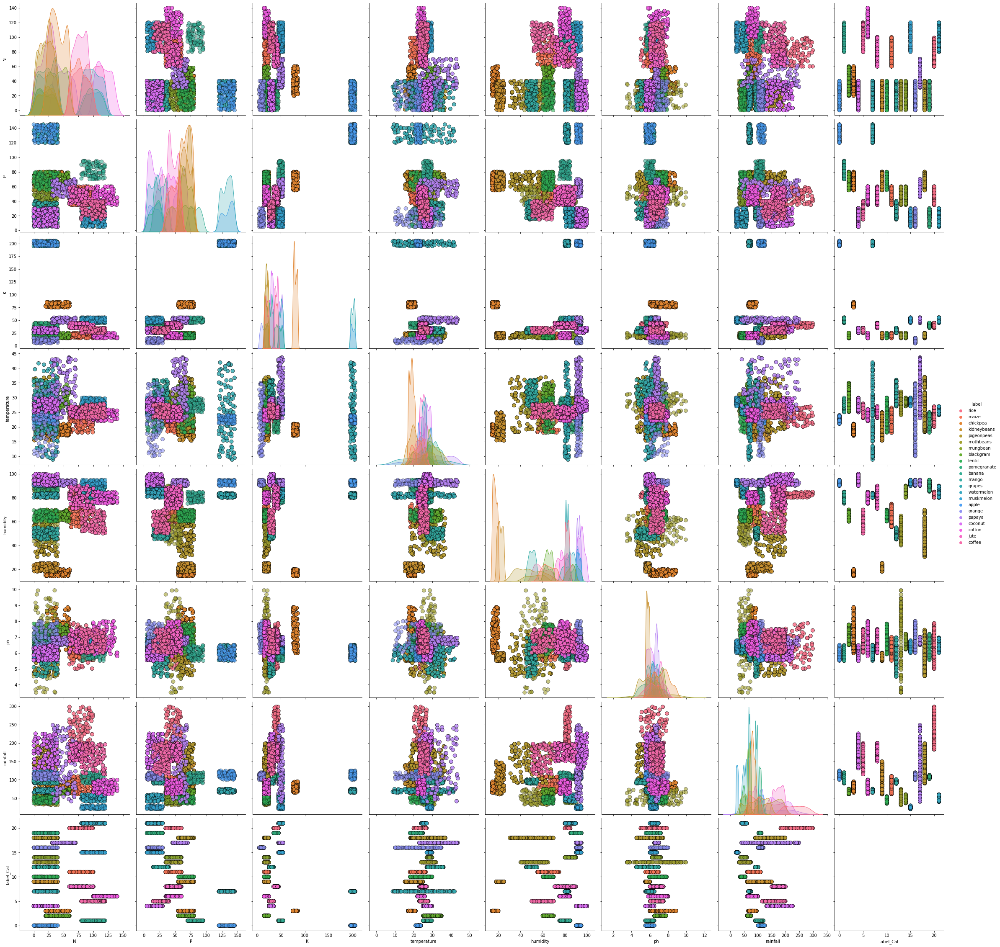

In [18]:
# Pair-plot understand feature distribution.
sb.pairplot(df, hue = 'label', diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 4)

**Corelation matrix**

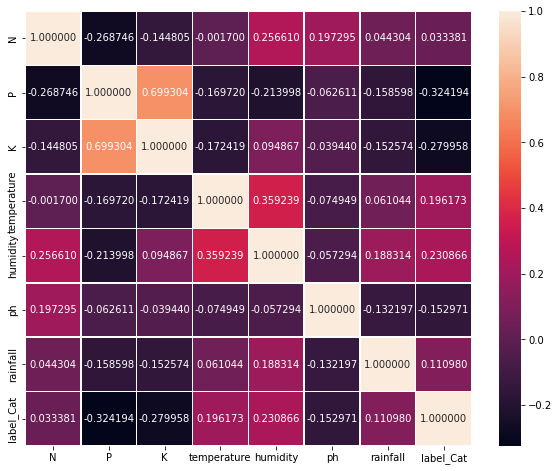

In [19]:
# Correlation matrix to understand feature relation.
correlation_mat = df.corr()
correlation_mat
plt.figure(figsize=(10,8))
sb.heatmap(correlation_mat, linewidths=.5,annot=True, fmt="f")

## ***Bivariate Analysis***

In [20]:
# Boxplot for soil properties:

fig = go.Figure()

# Add Traces:
fig.add_trace(go.Box(x=df['label'], y=df['N']))
fig.add_trace(go.Box(x=df['label'], y=df['K'], visible=False))  
fig.add_trace(go.Box(x=df['label'], y=df['P'], visible=False)) 
fig.add_trace(go.Box(x=df['label'], y=df['ph'], visible=False))

# Add Buttons:
fig.update_layout(
    updatemenus=[
        dict(
            active=1,
            buttons=list([ 
                
                dict(label='Nitrogen - N',
                     method='update',
                     args=[{'visible': [True, False,False,False, False]},
                           {'title': 'Boxplots for Soil Properties - Nitrogen'}]),
  
                dict(label='Phosphorous - K',
                     method='update',
                     args=[{'visible': [False, True, False, False, False]},
                           {'title': 'Boxplots for Soil Properties - Potassium'}]),
                
                dict(label='Potassium - P',
                     method='update',
                     args=[{'visible': [False, False, True, False, False]},
                           {'title': 'Boxplots for Soil Properties - Phosphorus'}]),
                
                dict(label='ph',
                     method='update',
                     args=[{'visible': [False, False, False, True, False]},
                           {'title': 'Boxplots for Soil Properties - pH'}]),          
                
               
            ]),
        )
    ])

# Set title:
fig.update_layout(title_text='Boxplots for Soil Properties', template='plotly_dark', height=500, width=900)

# fig.show()
display_HTML_files(fig, 'Feature_bi_variate_soil_properties.html', '/content/Feature_bi_variate_soil_properties.html')

In [21]:
# Boxplot with dropdown menu for main features:

fig = go.Figure()

# Add Traces

fig.add_trace(go.Box(x=df['label'], y=df['temperature']))
fig.add_trace(go.Box(x=df['label'], y=df['humidity'], visible=False))  
fig.add_trace(go.Box(x=df['label'], y=df['rainfall'], visible=False))  

# Add Buttons

fig.update_layout(
    updatemenus=[
        dict(
            active=1,
            buttons=list([ 
                
                dict(label='temperature',
                     method='update',
                     args=[{'visible': [True, False,False]},
                           {'title': 'Boxplot for Climate - temperature'}]),
  
                dict(label='humidity',
                     method='update',
                     args=[{'visible': [False, True, False]},
                           {'title': 'Boxplot for Climate - humidity'}]),
                
                dict(label='rainfall',
                     method='update',
                     args=[{'visible': [False, False, True]},
                           {'title': 'Boxplot for Climate - rainfall'}]),
                
               
            ]),
        )
    ])

# Set title
fig.update_layout(title_text='Boxplot for Climate', template='plotly_dark', width=900, height=500)

# fig.show()
display_HTML_files(fig, 'Feature_bi_variate_climate_properties.html', '/content/Feature_bi_variate_climate_properties.html')

## ***Univariate Analysis***

In [22]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=df['N']))
fig.add_trace(go.Histogram(x=df['K']))
fig.add_trace(go.Histogram(x=df['P']))
fig.add_trace(go.Histogram(x=df['temperature']))
fig.add_trace(go.Histogram(x=df['humidity']))
fig.add_trace(go.Histogram(x=df['ph']))
fig.add_trace(go.Histogram(x=df['rainfall']))

# Add Buttons

fig.update_layout(
    updatemenus=[
        dict(
            active=1,
            buttons=list([ 
                
                dict(label='N',
                     method='update',
                     args=[{'visible': [True, False, False, False, False, False, False, False]},
                           {'title': 'Nitrogen'}]),
  
                dict(label='Potassium - K',
                     method='update',
                     args=[{'visible': [False, True, False, False, False, False, False, False]},
                           {'title': 'Potassium'}]),

                dict(label='Phosphorus - P',
                     method='update',
                     args=[{'visible': [False, False, True, False, False, False, False, False]},
                           {'title': 'Phosphorus'}]),

                dict(label='Temperature',
                     method='update',
                     args=[{'visible': [False, False, False, True, False, False, False, False]},
                           {'title': 'Temperature'}]),

                dict(label='Humidity',
                     method='update',
                     args=[{'visible': [False, False, False, False, True, False, False, False]},
                           {'title': 'Humidity'}]),                                                                              

                dict(label='ph',
                     method='update',
                     args=[{'visible': [False, False, False, False, False, True, False, False]},
                           {'title': 'ph'}]),

                dict(label='Rainfall',
                     method='update',
                     args=[{'visible': [False, False, False, False, False, False, True, False]},
                           {'title': 'Rainfall'}]),                                                                            

            ]),
        )
    ])

# Set title
fig.update_layout(title_text='Histogram', template='plotly_dark', width=900, height=500)

# fig.show()
display_HTML_files(fig, 'Feature_Univariate.html', '/content/Feature_Univariate.html')

# **Preparing data for training and testing.**

Analysis shows that the temperature and ph are gaussian distributed. Therefore scaling them between 0 and 1

In [23]:
from sklearn.compose import ColumnTransformer

cat_vars = ["soil"]
num_vars = ["N", "P", "K", "temperature", "humidity", "ph", "rainfall"]

y = df['label_Cat'].values
X = df

X = df[num_vars + cat_vars]


colum_transformer = ColumnTransformer([('numerical', MinMaxScaler(), num_vars),('categorical', OneHotEncoder(), cat_vars),])

X = colum_transformer.fit_transform(X)

colum_transformer_pipeline = 'colum_transformer.sav'
pickle.dump(colum_transformer, open(colum_transformer_pipeline, 'wb'))

print(X)

[[0.64285714 0.26428571 0.19       ... 1.         0.         0.        ]
 [0.64285714 0.26428571 0.19       ... 0.         0.         0.        ]
 [0.60714286 0.37857143 0.18       ... 1.         0.         0.        ]
 ...
 [0.83571429 0.19285714 0.145      ... 0.         0.         0.        ]
 [0.74285714 0.09285714 0.125      ... 0.         0.         1.        ]
 [0.74285714 0.09285714 0.125      ... 0.         0.         0.        ]]


In [24]:
#train_data = pd.DataFrame(df)
#print(train_data.shape)

#y = df['label_Cat'].values
#X = df[['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall', 'soil']].values

#print("Shape of input data: {} and shape of target variable: {}".format(X.shape, y.shape))

In [25]:
#scaling the data
#scaler = MinMaxScaler()
#X = scaler.fit_transform(X)

#scalerfile = 'scaler.sav'
#pickle.dump(scaler, open(scalerfile, 'wb'))

In [26]:
# splitting the data into training and testing
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.4, random_state = 0)

# **Cross-validation-k-Fold**

In [27]:
# Lets split the data into 5 folds. 
# We will use this 'kf'(StratiFiedKFold splitting stratergy) object as input to cross_val_score() method
# The folds are made by preserving the percentage of samples for each class.
kf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# split()  method generate indices to split data into training and test set.
for train_index, test_index in kf.split(X, y):
    x_train_fold, x_test_fold = X[train_index], X[test_index]
    y_train_fold, y_test_fold = y[train_index], y[test_index]

    print("______________________________________________________________________________________________________")
    score = cross_val_score(ensemble.RandomForestClassifier(random_state= 42), x_train_fold, y_train_fold, cv= kf, scoring="accuracy")
    print(f'RandomForestClassifier Scores for each fold are: {score}')
    print(f'RandomForestClassifier Average score: {"{:.2f}".format(score.mean())}')
    print("______________________________________________________________________________________________________")

    score = cross_val_score(GaussianNB(), x_train_fold, y_train_fold, cv= kf, scoring="accuracy")
    print(f'GaussianNB Scores for each fold are: {score}')
    print(f'GaussianNB Average score: {"{:.2f}".format(score.mean())}')

    print("______________________________________________________________________________________________________")
    score = cross_val_score(lgb.LGBMClassifier(random_state= 42), x_train_fold, y_train_fold, cv= kf, scoring="accuracy")
    print(f'LGBMClassifier Scores for each fold are: {score}')
    print(f'LGBMClassifier Average score: {"{:.2f}".format(score.mean())}')

    print("______________________________________________________________________________________________________")
    score = cross_val_score(DecisionTreeClassifier(random_state= 42), x_train_fold, y_train_fold, cv= kf, scoring="accuracy")
    print(f'DecisionTreeClassifier Scores for each fold are: {score}')
    print(f'DecisionTreeClassifier Average score: {"{:.2f}".format(score.mean())}')

    print("______________________________________________________________________________________________________")
    score = cross_val_score(KNeighborsClassifier(n_neighbors = 5),x_train_fold, y_train_fold, cv=kf, scoring='accuracy')
    print(f'KNeighborsClassifier Scores for each fold are: {score}')
    print(f'KNeighborsClassifier Average score: {"{:.2f}".format(score.mean())}')

______________________________________________________________________________________________________
RandomForestClassifier Scores for each fold are: [0.99785867 0.99785638 0.99571275]
RandomForestClassifier Average score: 1.00
______________________________________________________________________________________________________
GaussianNB Scores for each fold are: [0.88972163 0.886388   0.88853162]
GaussianNB Average score: 0.89
______________________________________________________________________________________________________
LGBMClassifier Scores for each fold are: [0.99464668 0.99356913 0.99571275]
LGBMClassifier Average score: 0.99
______________________________________________________________________________________________________
DecisionTreeClassifier Scores for each fold are: [0.98715203 0.99142551 0.98928189]
DecisionTreeClassifier Average score: 0.99
______________________________________________________________________________________________________
KNeighborsClassif

# **Model - Single Classifier**
***XGBoost Classifier***

In [28]:
# declare parameters
params = {  'objective': 'reg:logistic',
            'max_depth': 4,
            'alpha': 10,
            'learning_rate': 0.1,
            'n_estimators':100
        }         
           
          
# instantiate the classifier 
xgb_clf = XGBClassifier(**params)


# fit the classifier to the training data
xgb_clf.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[22:31:06] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=2,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=10, reg_lambda=1, scale_pos_weight=None,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [29]:
# make predictions on test data

y_pred = xgb_clf.predict(X_test)

print(X_train[0])
print(y_train[0])

pred_num = xgb_clf.predict([X_train[0]])
print(pred_num)

pred = target_labelencoder.inverse_transform([pred_num])

print(pred)

[0.16428571 0.38571429 0.07       0.37761842 0.12382796 0.36503439
 0.39286598 0.         0.         1.         0.         0.        ]
9
[9]
['kidneybeans']


/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:154: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [30]:
# compute and print accuracy score

from sklearn.metrics import accuracy_score

print(y_test)

print(y_pred)


print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

[17  4  0 ... 13  0  1]
[17  4  0 ... 13  0  1]
XGBoost model accuracy score: 0.9952


# **Model - Ensemble Based Classifier**

In [31]:
from sklearn.utils.validation import check_is_fitted
# Ensemble with basic models

clf_list = [('decision tree', DecisionTreeClassifier()),
            ('knn', KNeighborsClassifier()),
            ('naive bayes classifier', GaussianNB()),
            ('random forst classifier', ensemble.RandomForestClassifier()),
            ('XGB Classifier', XGBClassifier())]

In [32]:
# Each model accuracy score
for model_tuple in clf_list:
    model = model_tuple[1]
    if 'random_state' in model.get_params().keys():
        model.set_params(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_pred, y_test)
    print(f"{model_tuple[0]}'s accuracy: {acc:.2f}")

decision tree's accuracy: 0.99
knn's accuracy: 0.99
naive bayes classifier's accuracy: 0.88
random forst classifier's accuracy: 1.00
[22:31:09] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



XGB Classifier's accuracy: 1.00


In [33]:
# Gather the output of all the models and finalize one outcome depending on voating
voting_clf = VotingClassifier(clf_list, voting='soft')
voting_clf.fit(X_train, y_train)

y_pred = voting_clf.predict(X_test)
print(f"Voting Classifier's accuracy: {accuracy_score(y_pred, y_test):.2f}")

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[22:31:12] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Voting Classifier's accuracy: 1.00


# **Results Visualization**

In [34]:
# Analysing predicted result
pred_result = classification_report(y_test, y_pred)
print(pred_result)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        30
           1       1.00      1.00      1.00        42
           2       1.00      0.99      0.99        75
           3       1.00      1.00      1.00       175
           4       1.00      1.00      1.00       113
           5       1.00      1.00      1.00        76
           6       1.00      1.00      1.00        95
           7       1.00      1.00      1.00        86
           8       0.99      0.98      0.99       120
           9       1.00      1.00      1.00       125
          10       1.00      1.00      1.00        35
          11       1.00      1.00      1.00        81
          12       1.00      1.00      1.00        75
          13       0.97      1.00      0.99        39
          14       1.00      1.00      1.00        40
          15       1.00      1.00      1.00        39
          16       1.00      1.00      1.00        39
          17       1.00    

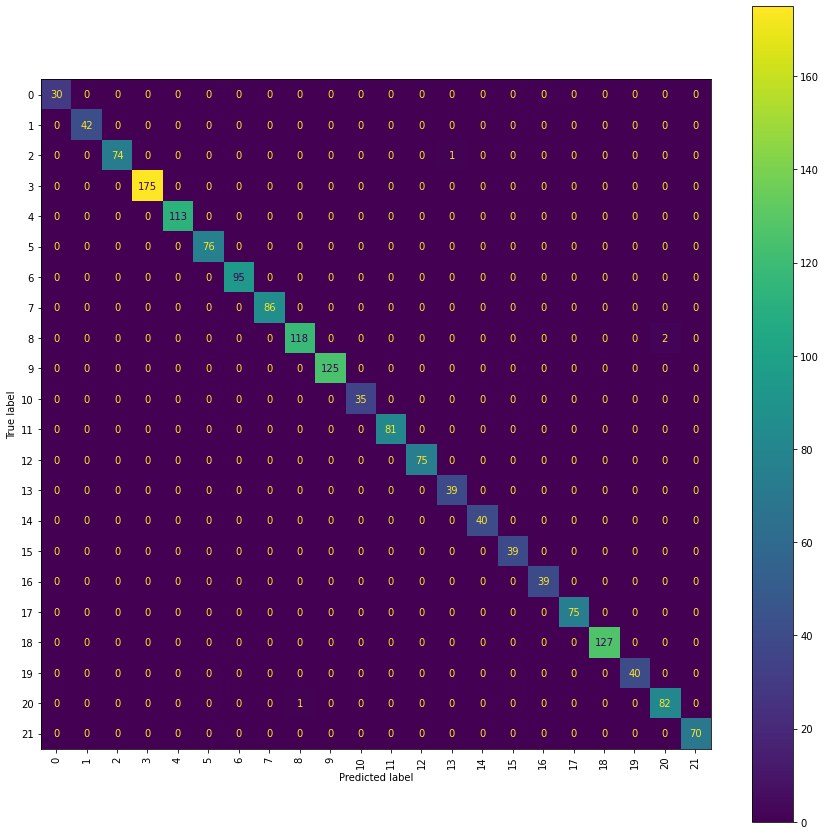

In [35]:
# confusion matrix to analyse the result.
con_matrix = confusion_matrix(y_test, y_pred, labels=voting_clf.classes_)
figure, axes = plt.subplots(1, figsize=(15,15))
disp = ConfusionMatrixDisplay(confusion_matrix=con_matrix, display_labels=voting_clf.classes_)
disp.plot(ax = axes, xticks_rotation='vertical')

# **Model Pickling**

In [36]:
#Pickling model
with open('Voting_Based_Model_Crop_Prediction_final.sav', 'wb') as pickle_file:
  pickle.dump(voting_clf, pickle_file)

In [39]:
from google.colab import files

files.download('Voting_Based_Model_Crop_Prediction_final.sav')
files.download('label_encoder.sav')
files.download('colum_transformer.sav')
files.download('Feature_bi_variate_soil_properties.html')
files.download('Feature_bi_variate_climate_properties.html')
files.download('Feature_Univariate.html')
files.download('data_distribution.html')
files.download('Crop_Prediction_Dataset.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [40]:
# Testing the saved model
def model_inference(feature_arr):
    print(os.path.getsize('Voting_Based_Model_Crop_Prediction_final.sav'))
    with open('Voting_Based_Model_Crop_Prediction_final.sav', 'rb') as pickle_file:
      model = pickle.load(pickle_file)
      prediction = model.predict(feature_arr)
      return prediction

arr = [[24,128,196,22.75088787,90.69489172,5.521466996,110.4317855,'loamy']]
arr = np.array(arr)

X = pd.DataFrame(arr, columns=num_vars + cat_vars)
print(X)
X = colum_transformer.transform(X)

pred = model_inference(X)

print(pred[0])
print(target_labelencoder.inverse_transform(pred))

    N    P    K  temperature     humidity           ph     rainfall   soil
0  24  128  196  22.75088787  90.69489172  5.521466996  110.4317855  loamy
11834459
0
['apple']
